In [1]:
import numpy as np   
import pandas as pd  
import matplotlib.pyplot as plt  
import seaborn as sns

In [2]:
df=pd.read_csv(r"C:\Users\mdirf\Downloads\EDA2\EDA2\adult_with_headers.csv")
print(df.head())

   age          workclass  fnlwgt   education  education_num  \
0   39          State-gov   77516   Bachelors             13   
1   50   Self-emp-not-inc   83311   Bachelors             13   
2   38            Private  215646     HS-grad              9   
3   53            Private  234721        11th              7   
4   28            Private  338409   Bachelors             13   

        marital_status          occupation    relationship    race      sex  \
0        Never-married        Adm-clerical   Not-in-family   White     Male   
1   Married-civ-spouse     Exec-managerial         Husband   White     Male   
2             Divorced   Handlers-cleaners   Not-in-family   White     Male   
3   Married-civ-spouse   Handlers-cleaners         Husband   Black     Male   
4   Married-civ-spouse      Prof-specialty            Wife   Black   Female   

   capital_gain  capital_loss  hours_per_week  native_country  income  
0          2174             0              40   United-States   <=50

In [3]:
print(df.isnull().sum())
print(df.duplicated().sum())
df_dropped=df.drop_duplicates()
print(df_dropped.duplicated().sum())

age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64
24
0


In [4]:
print(df_dropped.describe())
print(df_dropped.dtypes)

                age        fnlwgt  education_num  capital_gain  capital_loss  \
count  32537.000000  3.253700e+04   32537.000000  32537.000000  32537.000000   
mean      38.585549  1.897808e+05      10.081815   1078.443741     87.368227   
std       13.637984  1.055565e+05       2.571633   7387.957424    403.101833   
min       17.000000  1.228500e+04       1.000000      0.000000      0.000000   
25%       28.000000  1.178270e+05       9.000000      0.000000      0.000000   
50%       37.000000  1.783560e+05      10.000000      0.000000      0.000000   
75%       48.000000  2.369930e+05      12.000000      0.000000      0.000000   
max       90.000000  1.484705e+06      16.000000  99999.000000   4356.000000   

       hours_per_week  
count    32537.000000  
mean        40.440329  
std         12.346889  
min          1.000000  
25%         40.000000  
50%         40.000000  
75%         45.000000  
max         99.000000  
age                int64
workclass         object
fnlwgt       

In [5]:
#  Encodeing categorical variables
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df_encoded=df_dropped.copy()
for col in df_encoded.select_dtypes(include=['object']).columns:
    df_encoded[col]=le.fit_transform(df_encoded[col])
print(df_encoded)

       age  workclass  fnlwgt  education  education_num  marital_status  \
0       39          7   77516          9             13               4   
1       50          6   83311          9             13               2   
2       38          4  215646         11              9               0   
3       53          4  234721          1              7               2   
4       28          4  338409          9             13               2   
...    ...        ...     ...        ...            ...             ...   
32556   27          4  257302          7             12               2   
32557   40          4  154374         11              9               2   
32558   58          4  151910         11              9               6   
32559   22          4  201490         11              9               4   
32560   52          5  287927         11              9               2   

       occupation  relationship  race  sex  capital_gain  capital_loss  \
0               1        

In [6]:
# standard scaler
from sklearn.preprocessing import  StandardScaler
sc=StandardScaler()
df_scaled=sc.fit_transform(df_encoded)
print(df_scaled)

[[ 0.03038995  2.14997135 -1.06356884 ... -0.03566374  0.29133547
  -0.56337742]
 [ 0.8369732   1.46335725 -1.00866848 ... -2.22248299  0.29133547
  -0.56337742]
 [-0.0429358   0.09012905  0.24503992 ... -0.03566374  0.29133547
  -0.56337742]
 ...
 [ 1.42357919  0.09012905 -0.35877886 ... -0.03566374  0.29133547
  -0.56337742]
 [-1.2161478   0.09012905  0.11092955 ... -1.65552985  0.29133547
  -0.56337742]
 [ 0.9836247   0.77674315  0.92981187 ... -0.03566374  0.29133547
   1.77500901]]


In [7]:
# Label encoder
# Pros:
# 1  Simple and memory-efficient – Stores as a single column of integers.
# 2  Preserves ordinal relationships – Works well for ordinal categorical data (e.g., “Low < Medium < High”).
# 3  Fast to implement – Minimal preprocessing time.

# Cons:
# 1  Creates false ordinal relationships – For nominal categories (e.g., “Red”, “Blue”, “Green”), the numeric order implies ranking that doesn’t exist.
# 2  Can mislead algorithms – Many ML models (e.g., linear regression, distance-based models like KNN) might assume numerical magnitude has meaning.
# 3  Less interpretable – Harder to understand model weights when categories are encoded as numbers.

In [8]:
# one hot encoding
# Pros:
# 1   No false ordering – Ideal for nominal categorical variables.
# 2   Model-friendly – Works well with algorithms that assume numerical independence (e.g., linear/logistic regression, tree-based models).
# 3   Interpretable – Easy to understand feature meaning in model outputs.

# cons
# 1  High dimensionality – Adds a column per category; can lead to the “curse of dimensionality” for features with many unique values.
# 2  Sparsity – Produces sparse matrices with many zeros, increasing memory usage.
# 3  Less efficient – Training and inference can be slower with many categories.


In [9]:
# Create at least 2 new features that could be beneficial for the model. Explain the rationale behind your choices.

In [10]:
age_group = []
for age in df['age']:
    if age < 17:
        age_group.append("Minor")
    elif age >=18 and age <=30:
        age_group.append("Adult")
    elif age >= 31 and age <= 50:
        age_group.append("Senior")
    else:
        age_group.append("Old")
df['age']=age_group
print(df.to_string())

          age          workclass   fnlwgt      education  education_num          marital_status          occupation     relationship                 race      sex  capital_gain  capital_loss  hours_per_week               native_country  income
0      Senior          State-gov    77516      Bachelors             13           Never-married        Adm-clerical    Not-in-family                White     Male          2174             0              40                United-States   <=50K
1      Senior   Self-emp-not-inc    83311      Bachelors             13      Married-civ-spouse     Exec-managerial          Husband                White     Male             0             0              13                United-States   <=50K
2      Senior            Private   215646        HS-grad              9                Divorced   Handlers-cleaners    Not-in-family                White     Male             0             0              40                United-States   <=50K
3         Old           

In [11]:
for_hours=[]
for hours in df['hours_per_week']:
    if hours  < 35:
        for_hours.append('Part time')
    elif hours >=35 and hours <= 45:
        for_hours.append('Full time')
    else :
        for_hours.append('Over time')
df['hours_per_week']=for_hours
print(df.to_string())

          age          workclass   fnlwgt      education  education_num          marital_status          occupation     relationship                 race      sex  capital_gain  capital_loss hours_per_week               native_country  income
0      Senior          State-gov    77516      Bachelors             13           Never-married        Adm-clerical    Not-in-family                White     Male          2174             0      Full time                United-States   <=50K
1      Senior   Self-emp-not-inc    83311      Bachelors             13      Married-civ-spouse     Exec-managerial          Husband                White     Male             0             0      Part time                United-States   <=50K
2      Senior            Private   215646        HS-grad              9                Divorced   Handlers-cleaners    Not-in-family                White     Male             0             0      Full time                United-States   <=50K
3         Old            Pri

In [12]:
# ●Apply a transformation (e.g., log transformation) to at least one skewed numerical feature and justify your choice.

In [13]:
df['fnlwgt_log'] = np.log1p(df['fnlwgt'])
print(df)

          age          workclass  fnlwgt    education  education_num  \
0      Senior          State-gov   77516    Bachelors             13   
1      Senior   Self-emp-not-inc   83311    Bachelors             13   
2      Senior            Private  215646      HS-grad              9   
3         Old            Private  234721         11th              7   
4       Adult            Private  338409    Bachelors             13   
...       ...                ...     ...          ...            ...   
32556   Adult            Private  257302   Assoc-acdm             12   
32557  Senior            Private  154374      HS-grad              9   
32558     Old            Private  151910      HS-grad              9   
32559   Adult            Private  201490      HS-grad              9   
32560     Old       Self-emp-inc  287927      HS-grad              9   

            marital_status          occupation    relationship    race  \
0            Never-married        Adm-clerical   Not-in-famil

In [14]:
from sklearn.ensemble import IsolationForest

# Select numerical columns for outlier detection
num_cols = ['fnlwgt', 'education_num', 'capital_gain', 'capital_loss']

# Initialize and fit Isolation Forest
iso = IsolationForest(contamination=0.05, random_state=42)
y_pred = iso.fit_predict(df[num_cols])

# Add outlier flag
df['outlier'] = y_pred

# Keep only normal observations (outlier = 1)
df_clean = df[df['outlier'] == 1]

print("Original dataset shape:", df.shape)
print("Cleaned dataset shape:", df_clean.shape)


Original dataset shape: (32561, 17)
Cleaned dataset shape: (30934, 17)


In [15]:
# WITHOUT REMOVING OUTLIERS

# Outliers can pull model parameters toward extreme values, increasing bias.
# Outliers add noise, increasing variance and instability.

In [16]:
# AFTER REMOVING OUTLIERS

# Model focuses on true patterns in the data.
# More stable model, lower variance.

In [17]:
!pip install ppscore


  Using cached ppscore-1.3.0-py2.py3-none-any.whl
  Using cached pandas-1.5.3.tar.gz (5.2 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: still running...
  Getting requirements to build wheel: still running...
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
Failed to build pandas


  error: subprocess-exited-with-error
  
  × Building wheel for pandas (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [2527 lines of output]
      <string>:19: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
      C:\Users\mdirf\AppData\Local\Temp\pip-build-env-96q7eyld\overlay\Lib\site-packages\setuptools\dist.py:759: SetuptoolsDeprecationWarning: License classifiers are deprecated.
      !!
      
              ********************************************************************************
              Please consider removing the following classifiers in favor of a SPDX license expression:
      
              License :: OSI Approved :: BSD License
      
              See https://packaging.python.org/en/latest/guides/writing-pyproject-toml/#license for details.
         

In [20]:
# import pandas as pd
import ppscore as pps



# Calculate the PPS matrix
pps_matrix = pps.matrix(df)

# Display PPS matrix
pps_matrix.head()

# Create a heatmap for PPS
pps_heatmap = pps_matrix.pivot("x", "y", "ppscore")
plt.figure(figsize=(12,8))
sns.heatmap(pps_heatmap, cmap="coolwarm", annot=False)
plt.title("Predictive Power Score (PPS) Heatmap")
plt.show()


ModuleNotFoundError: No module named 'ppscore'

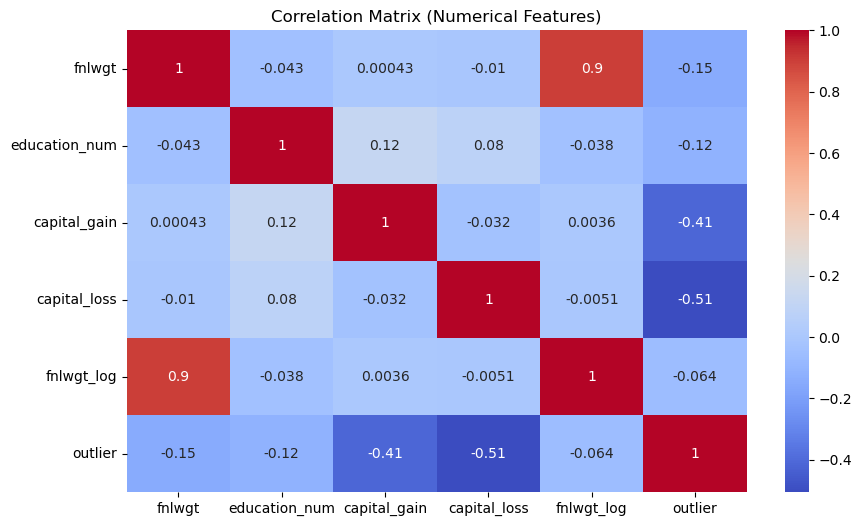

In [ ]:
# Select only numerical columns for correlation
numeric_cols = df.select_dtypes(include=['int64', 'float64'])

# Compute correlation
corr_matrix = numeric_cols.corr()

# Plot correlation heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=True)
plt.title("Correlation Matrix (Numerical Features)")
plt.show()
